<a href="https://colab.research.google.com/github/lanyu0322/phd_semester1/blob/master/time_series_for_amplitude.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
# -- mount google drive
from google.colab import drive
drive.mount("/content/drive")

# -- install geopandas
!pip install geopandas
!pip install gmaps

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive
     |████████████████████████████████| 931kB 2.8MB/s 
     |████████████████████████████████| 10.1MB 55.0MB/s 
     |████████████████████████████████| 11.8MB 41.3MB/s 
     |████████████████████████████████| 1.1MB 2.8MB/s 
  Created wheel for gmaps: filename=gmaps-0.9.0-py2.py3-none-any.whl size=2076096 sha256=9aa0b138e832c58bd792c6ae05a0f1399d593a84d5e1754125ea6b4d71f296e9
  Stored in directory: /root/.cache/pip/wheels/33/eb/41/5302168c36fc8ce8f48143bb58fde1

In [0]:
import os
import time
import numpy as np
import matplotlib.pyplot as plt

import pandas as pd
import geopandas as gp
from shapely.geometry import Point

import pyproj
from scipy.optimize import leastsq
import statistics

In [0]:
# -- read in the counts for yellow point 
fname = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "avg_weekend_ts.feather")
weekend = pd.read_feather(fname)
fname170 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0170.feather")
camera170 = pd.read_feather(fname170)
fname181 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0181.feather")
camera181 = pd.read_feather(fname181)
fname941 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0941.feather")
camera941 = pd.read_feather(fname941)

# -- read in the counts for purple point 
fname514 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0181.feather")
camera514 = pd.read_feather(fname514)
fname410 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0941.feather")
camera410 = pd.read_feather(fname410)

# -- read in the counts for green point 
fname489 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0181.feather")
camera489 = pd.read_feather(fname489)
fname891 = os.path.join("drive", "My Drive", "lwir", "data", "nycdot", "counts_wd_cam", "counts_wd_0941.feather")
camera891 = pd.read_feather(fname891)

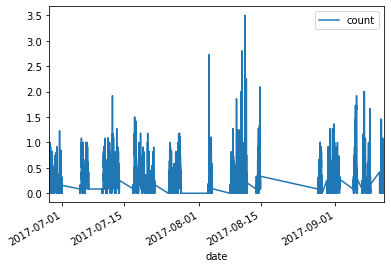

In [4]:
camera941.plot("date", "count")

In [0]:
#define group data
def group_data(data):
  data["day"] = data["date"].dt.date
  data["time"] = data["date"].dt.time
  return data


In [0]:
#camera_941.groupby("day").
# Yellow point
camera_941 = group_data(camera941)
camarr941 = camera_941.groupby(["day", "time"]).sum().unstack("time")

camera_181 = group_data(camera181)
camarr181 = camera_181.groupby(["day", "time"]).sum().unstack("time")

camera_170 = group_data(camera170)
camarr170 = camera_170.groupby(["day", "time"]).sum().unstack("time")


#purple point

camera_514 = group_data(camera514)
camarr514 = camera_514.groupby(["day", "time"]).sum().unstack("time")

camera_410 = group_data(camera410)
camarr410 = camera_410.groupby(["day", "time"]).sum().unstack("time")

#green point

camera_489 = group_data(camera489)
camarr489 = camera_489.groupby(["day", "time"]).sum().unstack("time")

camera_891 = group_data(camera891)
camarr891 = camera_891.groupby(["day", "time"]).sum().unstack("time")

In [0]:
# -- define gaussian
def gauss(xarr, x0, sig, scl):
  """ Create a 1D Gaussian """
  
  amp = scl / (sig * np.sqrt(2.0 * np.pi))
#   amp = scl
  val = -0.5 * ((xarr - x0) / sig)**2
  
  return amp * np.exp(val)

In [0]:
# -- define 4 fit model error
def res(param, xval, yval):
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = param
  model = gauss(xval, m1, sd1, scl1) + gauss(xval, m2, sd2, scl2) + \
            gauss(xval, m3, sd3, scl3) + wamp * wendvals + off
  return yval - model

In [9]:
# -- set inital guess
avgs  = [35, 47, 70]
sigs  = [3, 3, 3]
scls  = [5, 5, 5]
off   = [0.5]
wamp = [6]
param = avgs + sigs + scls + wamp + off
print(param)

[35, 47, 70, 3, 3, 3, 5, 5, 5, 6, 0.5]


In [10]:
#yellow point
# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final941 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final941.append(leastsq(res, param, args=(xval_final, camarr941.iloc[i])))


# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final181 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final181.append(leastsq(res, param, args=(xval_final, camarr181.iloc[i])))


# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final170 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final170.append(leastsq(res, param, args=(xval_final, camarr170.iloc[i])))


### purple point
# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final514 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final514.append(leastsq(res, param, args=(xval_final, camarr514.iloc[i])))

# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final410 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final410.append(leastsq(res, param, args=(xval_final, camarr410.iloc[i])))


### green point 
# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final489 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final489.append(leastsq(res, param, args=(xval_final, camarr489.iloc[i])))


# -- run the optimization (i.e., model fitting)
wendvals = weekend["avg_counts"].values
xval_final = np.arange(96)
plsq_final891 = []                       # [[a,b,c,d,...], [a,b,c,d,...]]
# GGD: We may need to write something here to check if the routine found a good solution
for i in range(31):
  plsq_final891.append(leastsq(res, param, args=(xval_final, camarr891.iloc[i])))

/usr/local/lib/python3.6/dist-packages/scipy/optimize/minpack.py:454: RuntimeWarning: Number of calls to function has reached maxfev = 2400.
  warnings.warn(errors[info][0], RuntimeWarning)


# Plot the model

# Yellow point

In [0]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr941.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

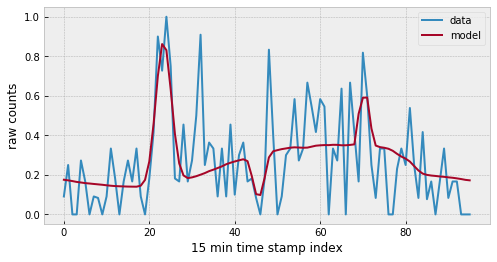

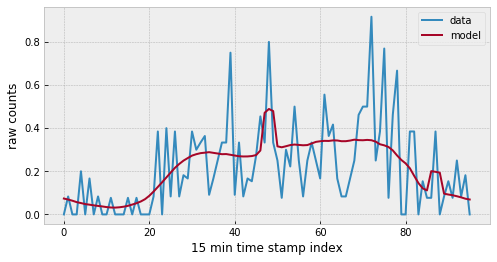

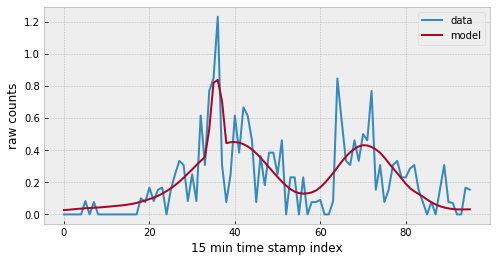

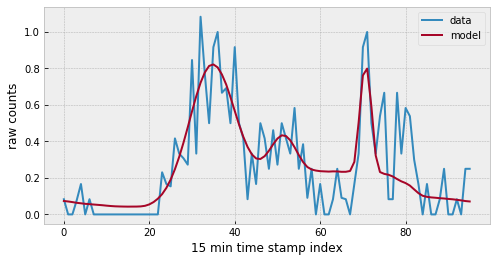

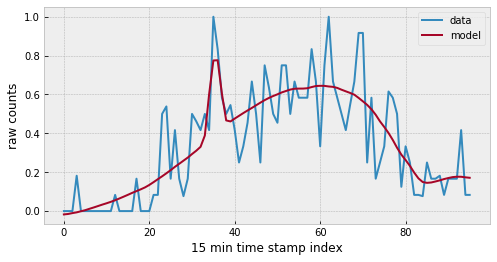

...

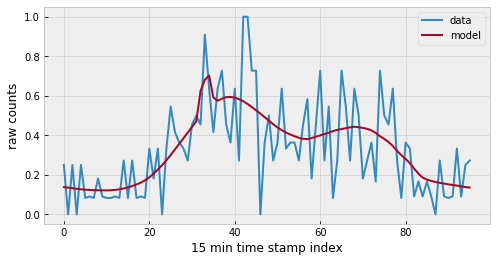

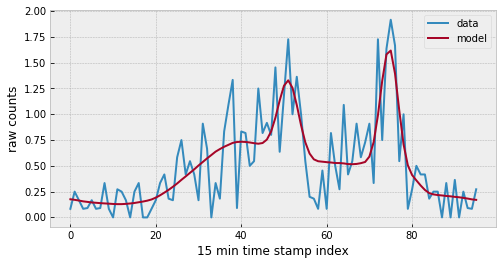

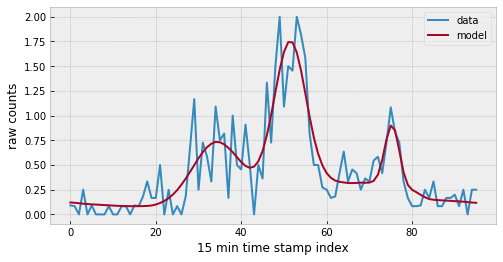

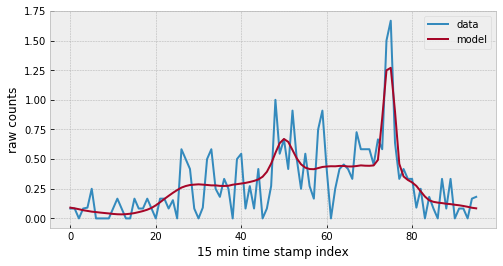

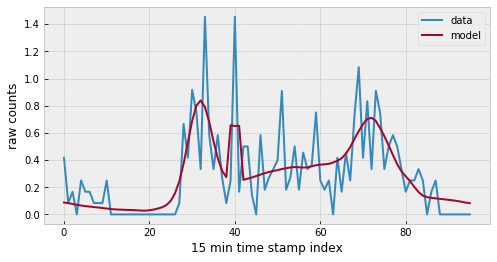

In [12]:
for i in range(len(plsq_final941)):
  huatu(plsq_final941[i][0], i, wendvals)

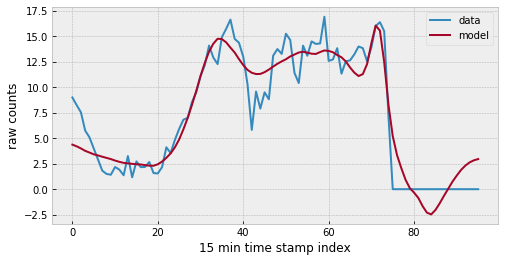

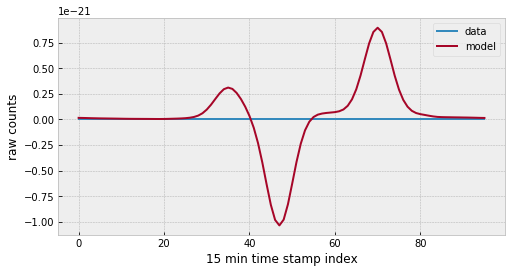

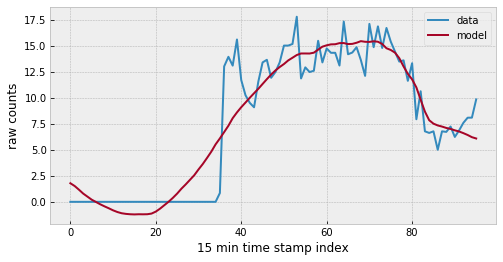

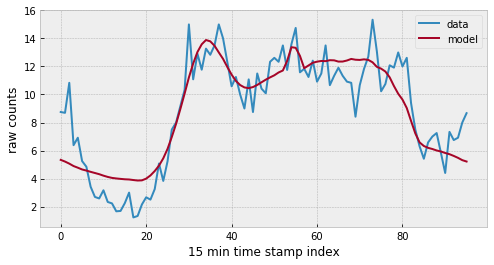

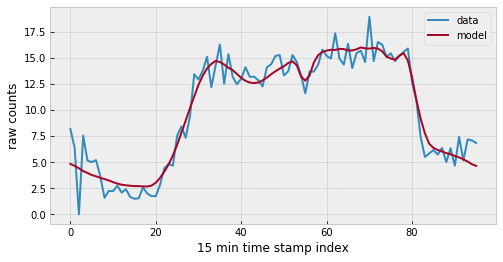

...

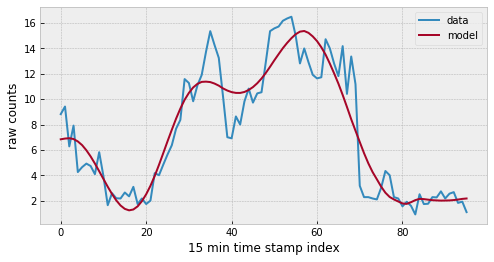

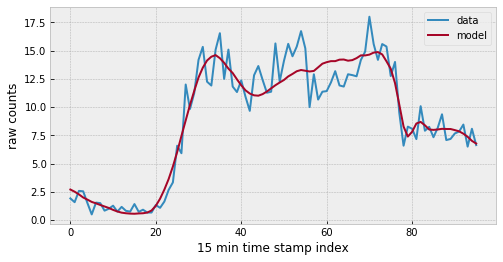

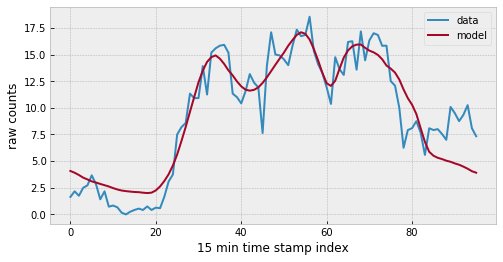

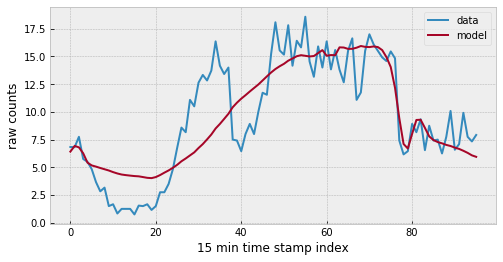

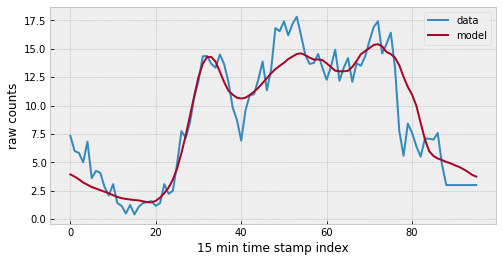

In [15]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr181.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final181)):
  huatu(plsq_final181[i][0], i, wendvals)

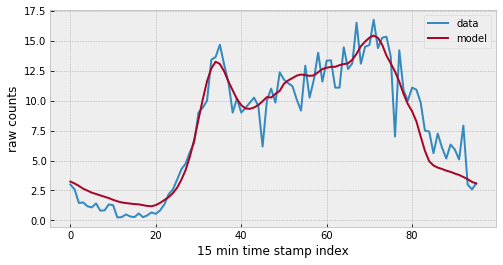

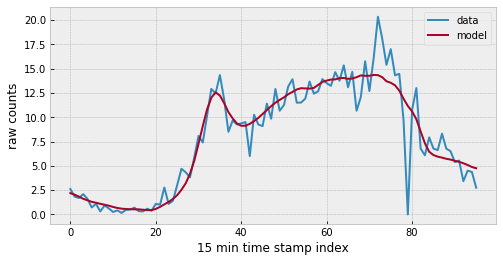

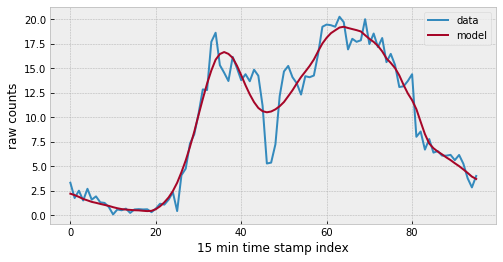

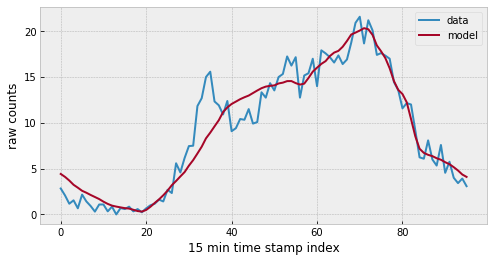

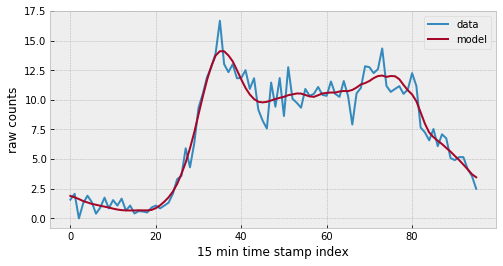

...

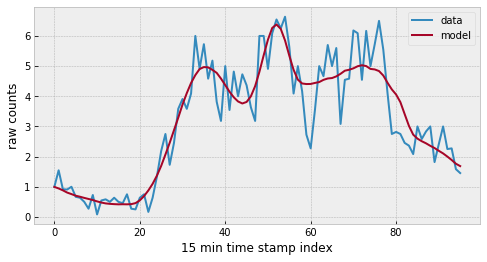

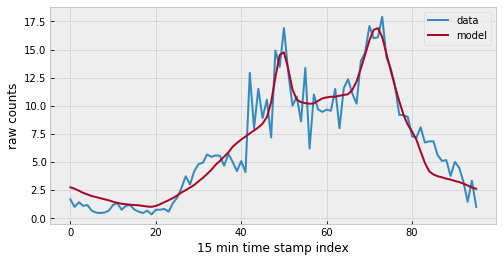

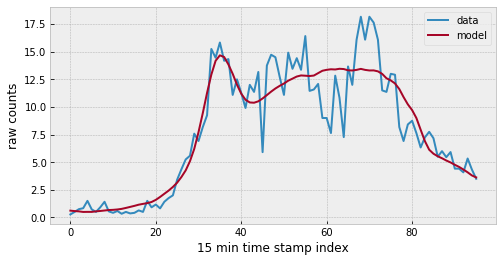

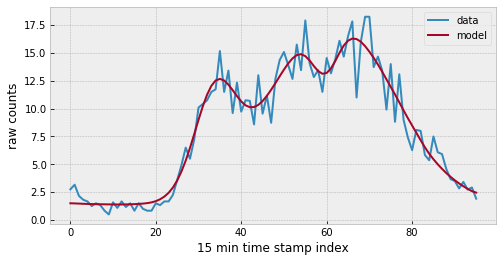

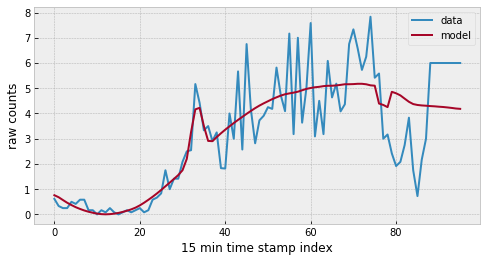

In [16]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr170.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final170)):
  huatu(plsq_final170[i][0], i, wendvals)

purple point

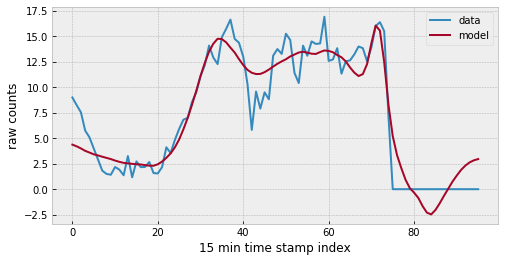

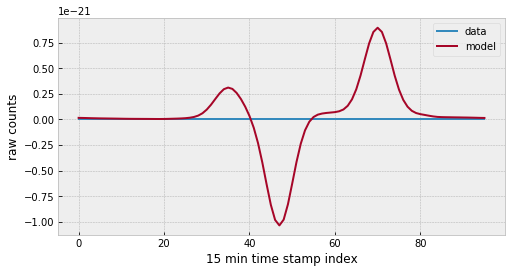

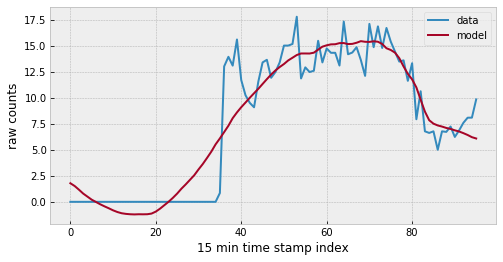

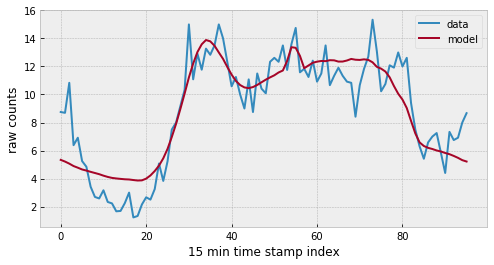

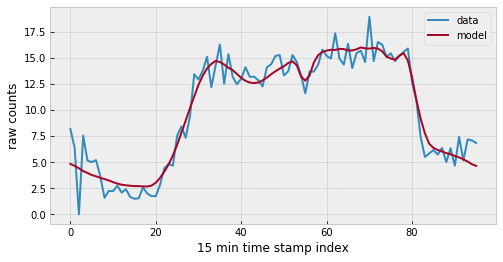

...

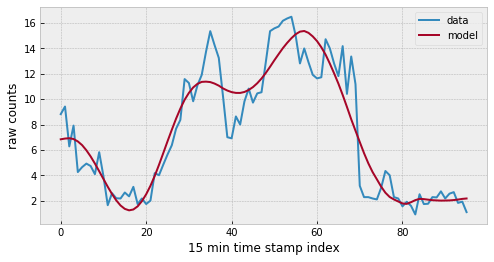

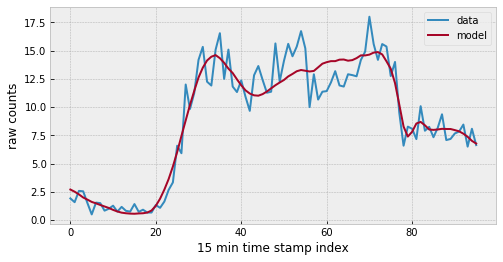

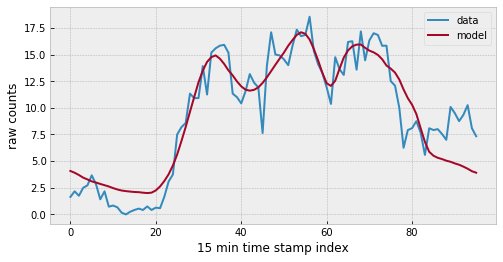

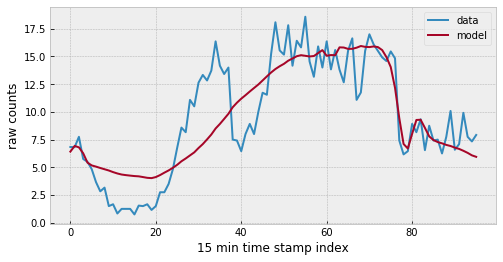

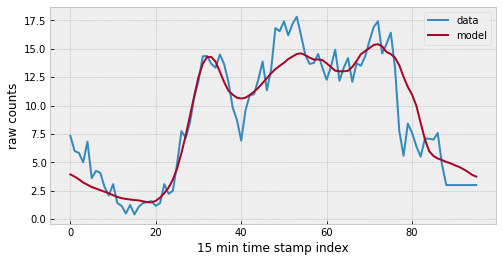

In [17]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr514.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final514)):
  huatu(plsq_final514[i][0], i, wendvals)

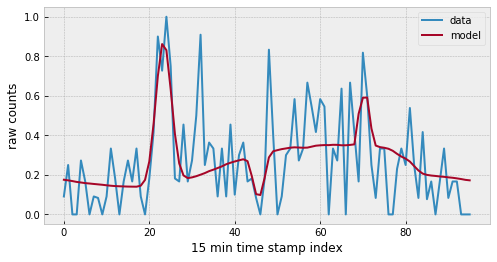

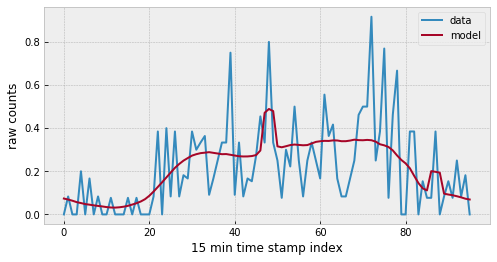

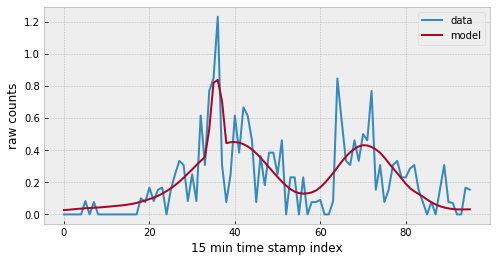

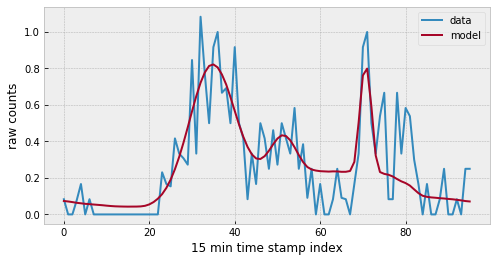

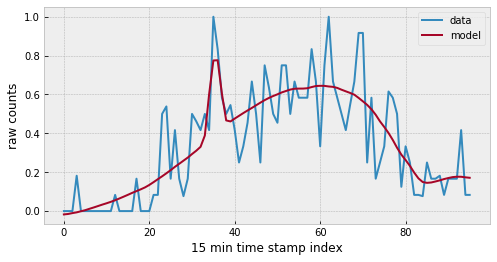

...

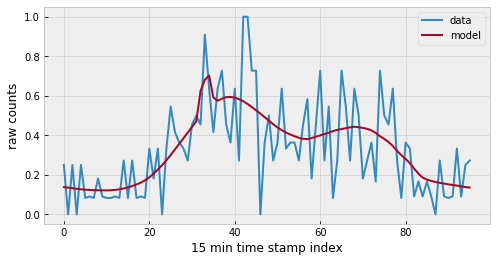

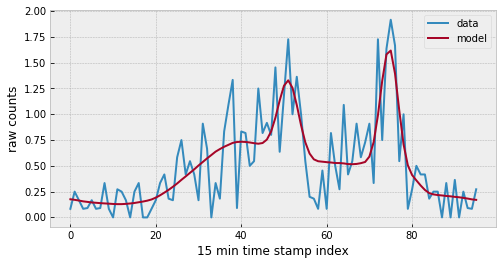

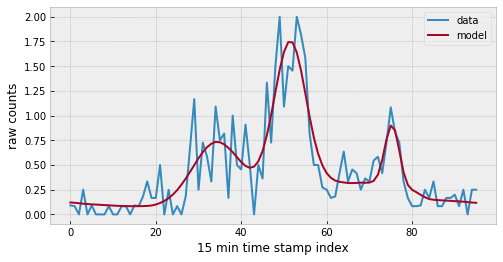

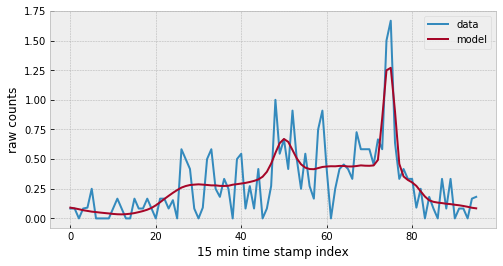

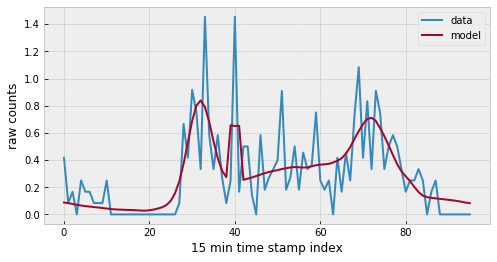

In [18]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr410.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final410)):
  huatu(plsq_final410[i][0], i, wendvals)

green point

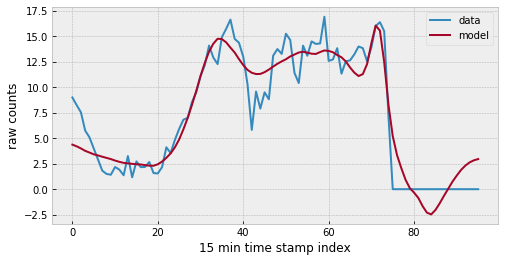

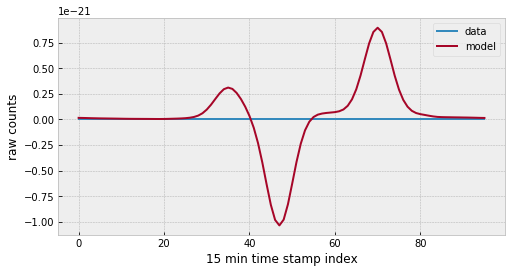

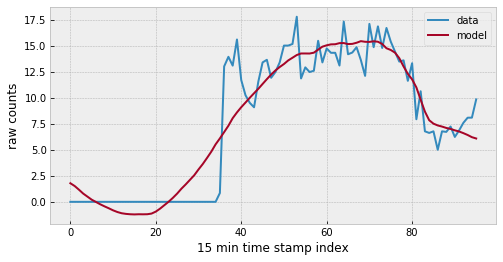

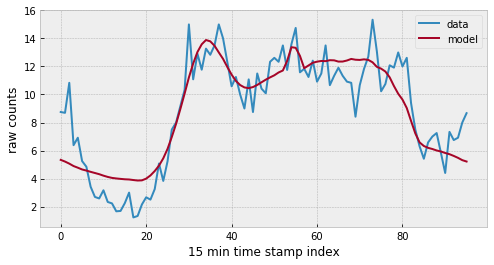

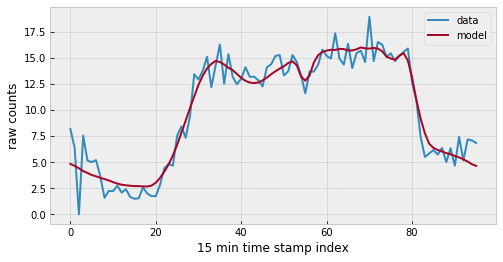

...

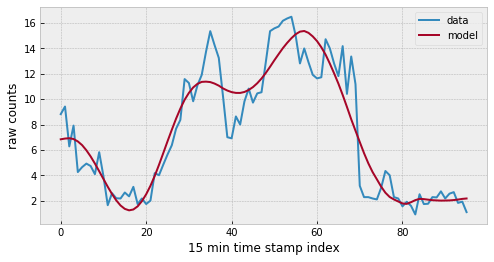

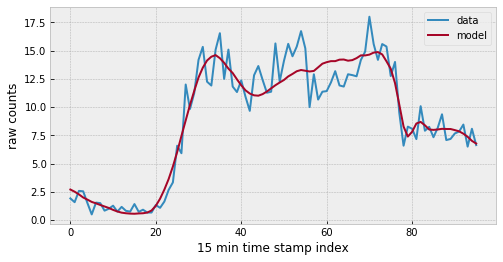

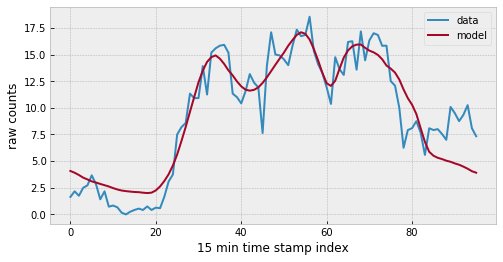

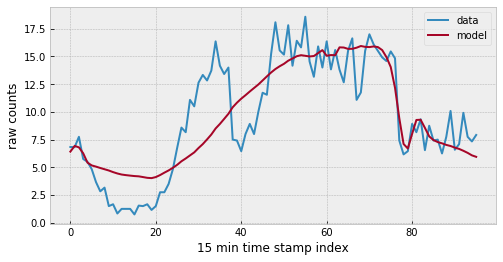

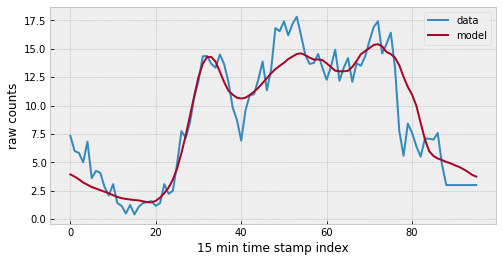

In [19]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr489.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final489)):
  huatu(plsq_final489[i][0], i, wendvals)

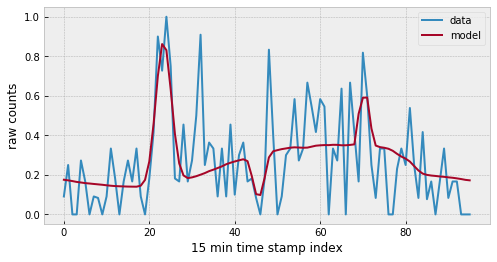

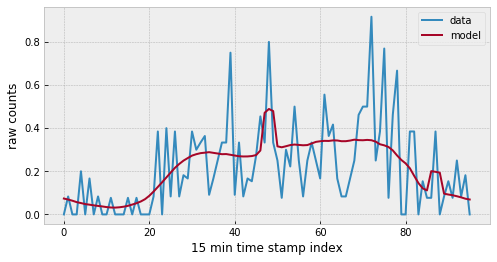

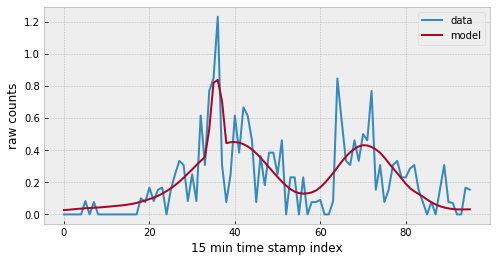

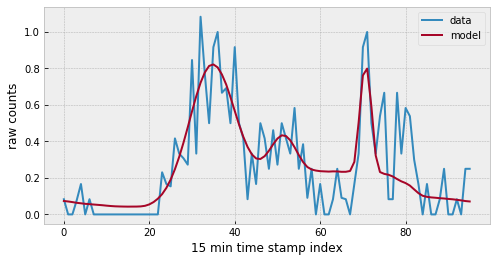

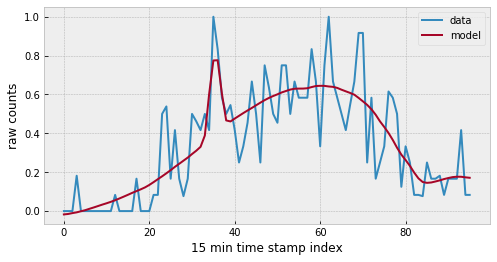

...

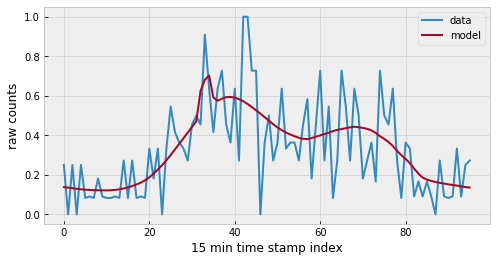

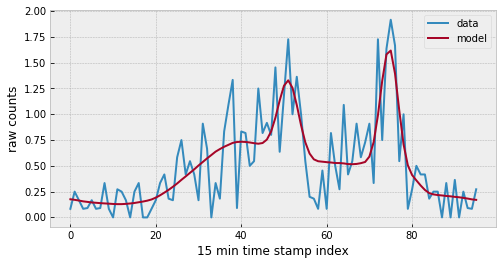

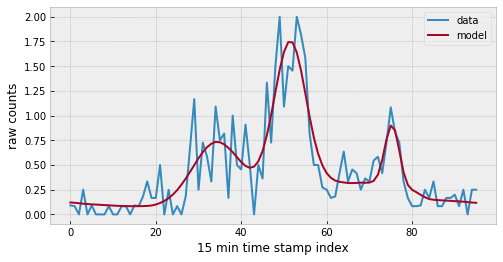

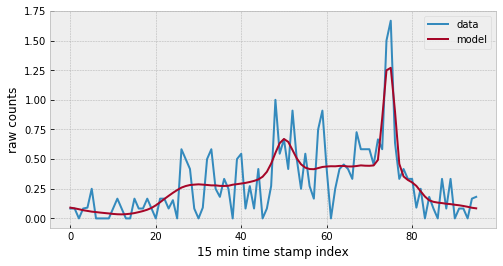

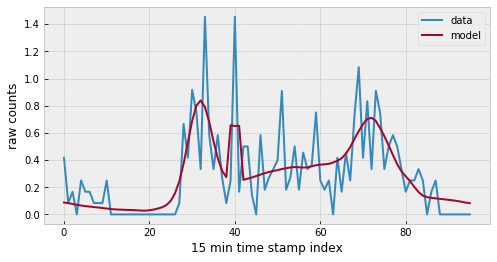

In [20]:
xval_final = np.arange(96)
from scipy.ndimage.filters import uniform_filter as uf

def huatu(plsq, i, wdt): 
  m1, m2, m3, sd1, sd2, sd3, scl1, scl2, scl3, wamp, off = plsq
  model = gauss(xval_final, m1, sd1, scl1) + gauss(xval_final, m2, sd2, scl2) + gauss(xval_final, m3, sd3, scl3) + wamp * wdt + off
  plt.style.use("bmh")
  fig, ax = plt.subplots(figsize=[8, 4])
  ax.plot(xval_final, camarr891.iloc[i], label="data")
  ax.plot(uf(model), label="model")
  plt.xlabel("15 min time stamp index")
  plt.ylabel("raw counts")
  plt.legend()
  plt.show()

for i in range(len(plsq_final514)):
  huatu(plsq_final891[i][0], i, wendvals)

# Plot time series

In [0]:

def parr_sequence(plsq_final):
  parr = np.vstack([i[0] for i in plsq_final])
  for i in range(31):
    if parr[i, 0] > parr[i, 1]:
      temp       = parr[i, 0]
      parr[i, 0] = parr[i, 1]
      parr[i, 1] = temp
      temp_sd    = parr[i, 3]
      parr[i, 3] = parr[i, 4]
      parr[i, 4] = temp_sd
      temp_scl   = parr[i, 6]
      parr[i, 6] = parr[i, 7]
      parr[i, 7] = temp_scl
  for i in range(31):
    if parr[i, 1] > parr[i, 2]:
      temp       = parr[i, 1]
      parr[i, 1] = parr[i, 2]
      parr[i, 2] = temp
      temp_sd    = parr[i, 4]
      parr[i, 4] = parr[i, 5]
      parr[i, 5] = temp_sd
      temp_scl   = parr[i, 7]
      parr[i, 7] = parr[i, 8]
      parr[i, 8] = temp_scl
  print(parr[:, 0] < parr[:, 1])
  print(parr[:, 1] < parr[:, 2])
  
  return parr



In [0]:
parr941 = parr_sequence(plsq_final941)
parr181 = parr_sequence(plsq_final181)
parr170 = parr_sequence(plsq_final170)

parr514 = parr_sequence(plsq_final514)
parr410 = parr_sequence(plsq_final410)

parr489 = parr_sequence(plsq_final489)
parr891 = parr_sequence(plsq_final891)

[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True]
[ True  True False  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True  True  True  True  True  True
  True  True  True  True  True  True  True]
[ True  True  True  True  True  True  True  True  

In [0]:
camerindex = camera941.groupby("day").sum()
cam = pd.DataFrame(camerindex)
day = cam.index

def plot_camera(parr):
  parr = pd.DataFrame(parr)
  parr.columns = ["m1", "m2", "m3", "sig1", "sig2", "sig3", "scl1", "scl2", "scl3", "wamp", "off"]  
  fig, ax = plt.subplots(figsize=[15, 5])
  plt.plot(day, parr["wamp"])

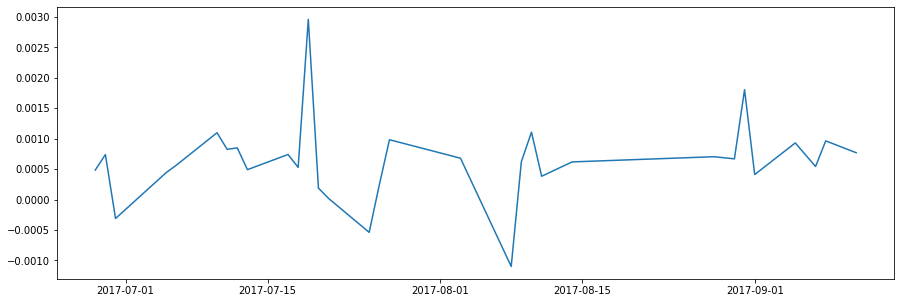

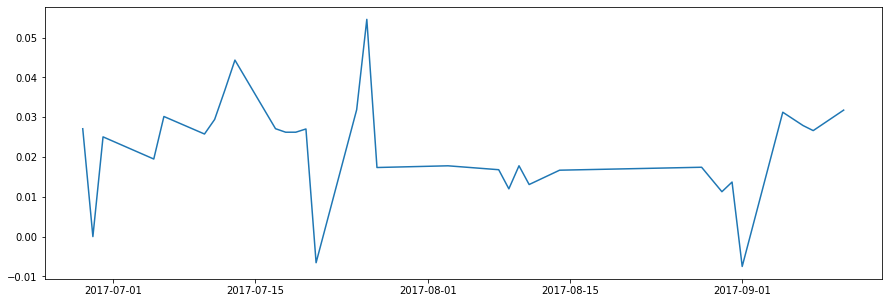

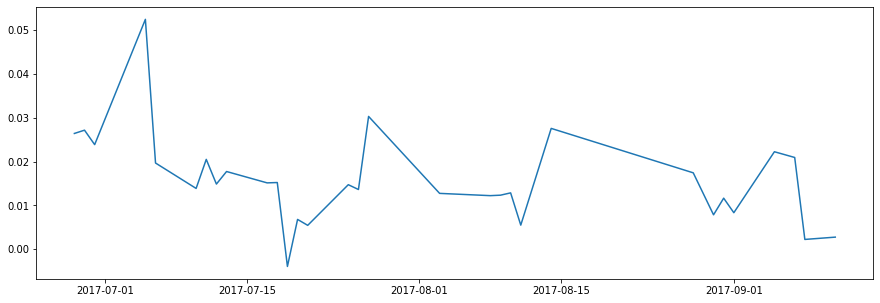

In [0]:
#plot for yellow point
plot_camera(parr941)
plot_camera(parr181)
plot_camera(parr170)

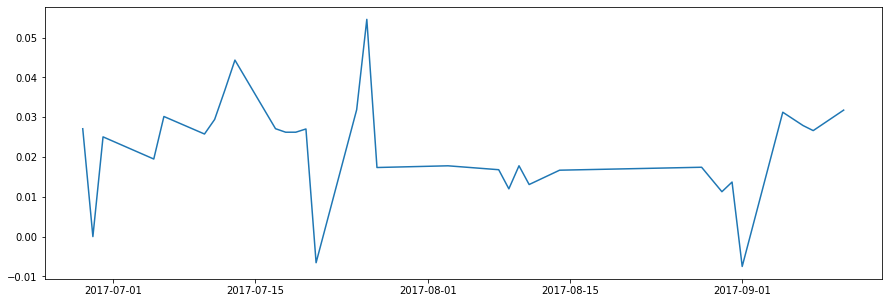

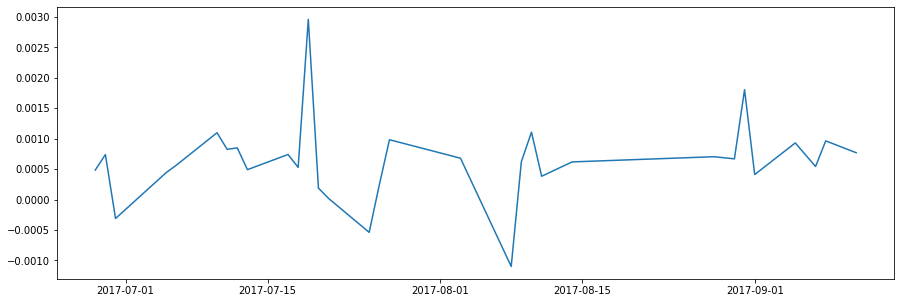

In [0]:
#plot for purple point
plot_camera(parr514)
plot_camera(parr410)

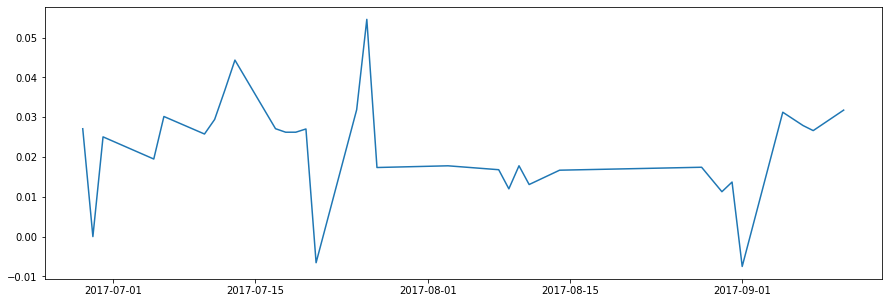

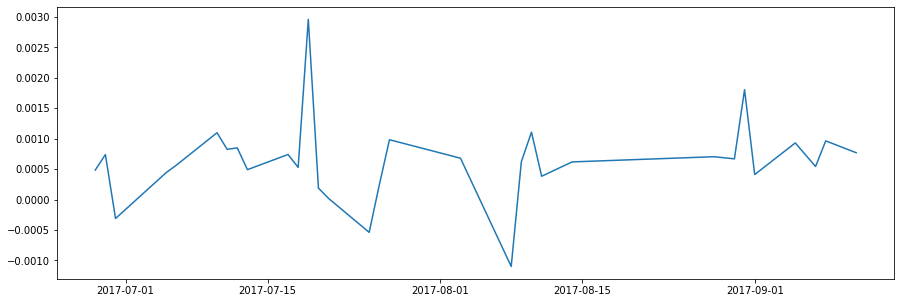

In [0]:
#plot for green plot
plot_camera(parr489)
plot_camera(parr891)

In [0]:
#useful imports
import folium
# -- create a map
mymap = folium.Map(location=[40.76, -74], zoom_start=8, width=500)

fname = "/content/drive/My Drive/lwir/data/green_point_location.csv"
sub = pd.read_csv(fname)

# -- add each Natural area to the map, one by one
ndata = len(sub)
for ii in range(ndata):

  lat  = sub["lat"].iloc[ii]
  lon  = sub["lon"].iloc[ii]

  circ = folium.Circle(location=[lat, lon], radius=20, fill=True, color="red")
  circ.add_to(mymap)

mymap